# Week 5A<br>Getting Data Part 1: Working with APIs
Oct 4, 2021

## Week #5 Agenda

- Introduction to APIs
- Pulling census data and shape files using Python
    - Example: Lead poisoning in Philadelphia
- Using the Twitter API
    - Plotting geocoded tweets
    - Word frequencies
    - Sentiment analysis

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import Point

from matplotlib import pyplot as plt
import seaborn as sns

import hvplot.pandas
import holoviews as hv

In [3]:
# UNCOMMENT TO SEE ALL ROWS/COLUMNS IN DATAFRAMES
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999 
pd.options.display.max_colwidth = 200

## Introduction to APIs

Or, how to pull data from the web using Python

## Example APIs

- Socrata Open Data: https://dev.socrata.com/
- Open Data Philly: https://opendataphilly.org
- US Census Bureau: https://www.census.gov/data/developers/data-sets.html

- Bureau of Labor Statistics: https://www.bls.gov/developers/
- US Geological Survey: https://www.usgs.gov/products/data-and-tools/apis
- US Environmental Protection Agency: https://www.epa.gov/enviro/web-services

- Google APIs: https://console.developers.google.com/apis/library?project=cp255-185021
- Facebook: https://developers.facebook.com/docs/apis-and-sdks/
- Twitter: https://developer.twitter.com/en/docs/api-reference-index.html

- Foursquare: https://developer.foursquare.com/
- Instagram: https://www.instagram.com/developer/
- Yelp: https://www.yelp.com/developers

**Note**: when accessing data via API, many services will require you to register an API key to prevent you from overloading the service with requests

## Part 1: Reading an automated data feed

### USGS real-time earthquake feeds
This is an API for near-real-time data about earthquakes, and data is provided in GeoJSON format over the web. 

The API has a separate endpoint for each version of the data that users might want. No authentication is required.

API documentation:

http://earthquake.usgs.gov/earthquakes/feed/v1.0/geojson.php

Sample API endpoint, for magnitude 4.5+ earthquakes in past day:

http://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/4.5_day.geojson

#### GeoPandas can read GeoJSON from the web directly

Simply pass the URL to the `gpd.read_file()` function:

In [4]:
# Download data on magnitude 2.5+ quakes from the past week
endpoint_url = "http://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/2.5_week.geojson"
df = gpd.read_file(endpoint_url)

In [5]:
df.head() 

,id,mag,place,time,updated,tz,url,detail,felt,cdi,mmi,alert,status,tsunami,sig,net,code,ids,sources,types,nst,dmin,rms,gap,magType,type,title,geometry
0,nc73636810,3.66,"13km SSE of Bodie, CA",1633652029330,1633653617567,None,https://earthquake.usgs.gov/earthquakes/eventpage/nc73636810,https://earthquake.usgs.gov/earthquakes/feed/v1.0/detail/nc73636810.geojson,6.0,3.2,3.779,None,reviewed,0,208,nc,73636810,",nc73636810,nn00825152,us6000fsux,",",nc,nn,us,",",dyfi,focal-mechanism,nearby-cities,origin,phase-data,scitech-link,shakemap,",83.0,NaN,0.22,80.0,ml,earthquake,"M 3.7 - 13km SSE of Bodie, CA",POINT Z (-118.96117 38.10083 7.89000)
1,ak021cvfn4ap,2.60,"51 km NNE of Kobuk, Alaska",1633644683992,1633646189040,None,https://earthquake.usgs.gov/earthquakes/eventpage/ak021cvfn4ap,https://earthquake.usgs.gov/earthquakes/feed/v1.0/detail/ak021cvfn4ap.geojson,NaN,NaN,NaN,None,automatic,0,104,ak,021cvfn4ap,",us6000fsuh,ak021cvfn4ap,",",us,ak,",",origin,phase-data,",NaN,NaN,0.64,NaN,ml,earthquake,"M 2.6 - 51 km NNE of Kobuk, Alaska",POINT Z (-156.31620 67.31640 1.10000)
2,us6000fsua,4.40,"166 km S of La Libertad, El Salvador",1633643119644,1633644179040,None,https://earthquake.usgs.gov/earthquakes/eventpage/us6000fsua,https://earthquake.usgs.gov/earthquakes/feed/v1.0/detail/us6000fsua.geojson,NaN,NaN,NaN,None,reviewed,0,298,us,6000fsua,",us6000fsua,",",us,",",origin,phase-data,",NaN,1.650,0.70,209.0,mb,earthquake,"M 4.4 - 166 km S of La Libertad, El Salvador",POINT Z (-89.53640 11.99580 10.00000)
3,us6000fssl,6.10,Macquarie Island region,1633637581819,1633648212759,None,https://earthquake.usgs.gov/earthquakes/eventpage/us6000fssl,https://earthquake.usgs.gov/earthquakes/feed/v1.0/detail/us6000fssl.geojson,1.0,1.0,0.000,green,reviewed,0,573,us,6000fssl,",us6000fssl,",",us,",",dyfi,losspager,moment-tensor,origin,phase-data,shakemap,",NaN,4.306,0.76,105.0,mww,earthquake,M 6.1 - Macquarie Island region,POINT Z (158.44910 -58.78440 10.00000)
4,ak021cveg7ut,3.00,"197 km ESE of Chiniak, Alaska",1633637459530,1633638717066,None,https://earthquake.usgs.gov/earthquakes/eventpage/ak021cveg7ut,https://earthquake.usgs.gov/earthquakes/feed/v1.0/detail/ak021cveg7ut.geojson,NaN,NaN,NaN,None,automatic,0,138,ak,021cveg7ut,",ak021cveg7ut,",",ak,",",origin,",NaN,NaN,0.53,NaN,ml,earthquake,"M 3.0 - 197 km ESE of Chiniak, Alaska",POINT Z (-149.35690 56.82590 28.70000)


## Let's plot them on a map:

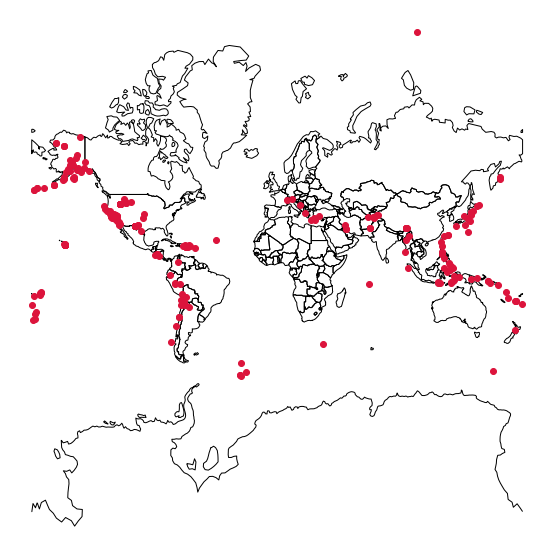

In [6]:
fig, ax = plt.subplots(figsize=(10, 10))

# plot the country outline
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
world.to_crs(epsg=3857).plot(ax=ax, facecolor="none", edgecolor="black")

# plot the earthquakes
df.to_crs(epsg=3857).plot(ax=ax, color="crimson")

ax.set_axis_off()

## Part 2: GeoServices

A GeoService is a standardized format for returning GeoJSON files over the web.

Documentation http://geoservices.github.io/

OpenDataPhilly provides GeoService API endpoints for the geometry hosted on its platform

## Example: Philadelphia ZIP codes

https://www.opendataphilly.org/dataset/zip-codes

In [7]:
# base URL
url = "https://services.arcgis.com/fLeGjb7u4uXqeF9q/arcgis/rest/services/Zipcodes_Poly/FeatureServer/0/"

###  Small utility package to make querying GeoServices easier: `esri2gpd`

https://github.com/PhiladelphiaController/esri2gpd

In [8]:
import esri2gpd

In [9]:
zip_codes = esri2gpd.get(url)

In [10]:
zip_codes.head()

,geometry,OBJECTID,CODE,COD,Shape__Area,Shape__Length
0,"POLYGON ((-75.11107 40.04682, -75.11206 40.04739, -75.11237 40.04757, -75.11293 40.04790, -75.11451 40.04882, -75.11507 40.04914, -75.11706 40.05030, -75.11857 40.05115, -75.11954 40.05170, -75.11...",1,19120,20,9.177970e+07,49921.544063
1,"POLYGON ((-75.19227 39.99463, -75.19240 39.99468, -75.19241 39.99468, -75.19242 39.99469, -75.19263 39.99478, -75.19380 39.99529, -75.19402 39.99504, -75.19425 39.99479, -75.19449 39.99455, -75.19...",2,19121,21,6.959879e+07,39534.887217
2,"POLYGON ((-75.15406 39.98601, -75.15494 39.98613, -75.15494 39.98613, -75.15541 39.98619, -75.15607 39.98627, -75.15628 39.98629, -75.15662 39.98471, -75.15692 39.98323, -75.15726 39.98170, -75.15...",3,19122,22,3.591632e+07,24124.645221
3,"POLYGON ((-75.15190 39.97056, -75.15258 39.97058, -75.15258 39.97058, -75.15368 39.97073, -75.15415 39.97079, -75.15464 39.97085, -75.15572 39.97099, -75.15728 39.97120, -75.15861 39.97136, -75.15...",4,19123,23,3.585175e+07,26421.728982
4,"POLYGON ((-75.09660 40.04249, -75.09661 40.04250, -75.09783 40.04149, -75.09796 40.04138, -75.09799 40.04136, -75.09848 40.04096, -75.09890 40.04060, -75.09912 40.04041, -75.09934 40.04021, -75.09...",5,19124,24,1.448080e+08,63658.770420


In [11]:
zip_codes.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Let's plot it

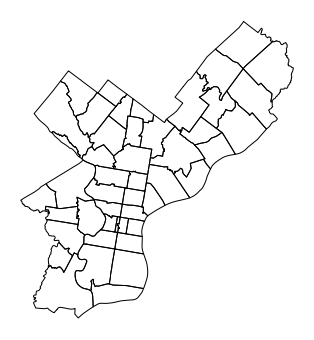

In [12]:
fig, ax = plt.subplots(figsize=(6, 6))
zip_codes.to_crs(epsg=3857).plot(ax=ax, facecolor="none", edgecolor="black")
ax.set_axis_off()

## Another useful example: census tracts

https://www.opendataphilly.org/dataset/census-tracts

## Part 3: Downloading Philly data from CARTO

- Philadelphia hosts the majority of its open data in the cloud using CARTO. 
- They provide an API to download the data
- You can access the API documentation from OpenDataPhilly

**Note: the "API documentation" on OpenDataPhilly will link to the documentation for the CARTO database**

For example: shooting victims in Philadelphia

https://www.opendataphilly.org/dataset/shooting-victims

### Download link is just querying an API!

`https://phl.carto.com/api/v2/sql?q=SELECT+*,+ST_Y(the_geom)+AS+lat,+ST_X(the_geom)+AS+lng+FROM+shootings&filename=shootings&format=csv&skipfields=cartodb_id`

- First line: the base URL for CARTO
- Second line: the SQL query

## SQL Databases

The CARTO databases can be queried using SQL. This allows you to select specific data from the larger database.

CARTO API documentation: https://carto.com/developers/sql-api/

SQL documentation: https://www.postgresql.org/docs/9.1/sql.html

## General Query Syntax

`SELECT [field names] FROM [table name] WHERE [query]`

## Let's try it out in Python

We'll use Python's `requests` library to query the API endpoint with our desired query.

In [13]:
import requests

In [14]:
# the API end point
API_endpoint = "https://phl.carto.com/api/v2/sql"

# the query
query = "SELECT * FROM shootings" # table name is "shootings"

# desired format of the returned features
output_format = 'geojson'

# fields to skip
skipfields = ["cartodb_id"]

In [15]:
# all of our request parameters
params = dict(q=query, format=output_format, skipfields=skipfields)

params

{'q': 'SELECT * FROM shootings',
 'format': 'geojson',
 'skipfields': ['cartodb_id']}

In [16]:
# make the request
r = requests.get(API_endpoint, params=params)

r

<Response [200]>

In [17]:
# Get the returned data in JSON format
# This is a dictionary
features = r.json()

In [18]:
# What are the keys?
list(features.keys())

['type', 'features']

In [19]:
features['type']

'FeatureCollection'

In [20]:
# Let's look at the first feature
features['features'][0]

{'type': 'Feature',
 'geometry': {'type': 'Point', 'coordinates': [-75.148805, 39.94162]},
 'properties': {'objectid': 1338339,
  'year': 2019,
  'dc_key': '201903066339.0',
  'code': '0411',
  'date_': '2019-09-14T00:00:00Z',
  'time': '00:40:00',
  'race': 'B',
  'sex': 'M',
  'age': '28',
  'wound': 'foot',
  'officer_involved': 'N',
  'offender_injured': 'N',
  'offender_deceased': 'N',
  'location': '300 BLOCK South St',
  'latino': 0,
  'point_x': -75.14880481,
  'point_y': 39.94162015,
  'dist': '3',
  'inside': 0,
  'outside': 1,
  'fatal': 0}}

Use the `GeoDataFrame.from_features()` function to create a GeoDataFrame

In [28]:
shootings = gpd.GeoDataFrame.from_features(features, crs="EPSG:4326")

In [29]:
shootings.head()

,geometry,objectid,year,dc_key,code,date_,time,race,sex,age,wound,officer_involved,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal
0,POINT (-75.14880 39.94162),1338339,2019,201903066339.0,0411,2019-09-14T00:00:00Z,00:40:00,B,M,28,foot,N,N,N,300 BLOCK South St,0.0,-75.148805,39.941620,3,0.0,1.0,0.0
1,POINT (-75.16174 39.94331),1338340,2019,201903068722.0,0411,2019-09-22T00:00:00Z,04:15:00,B,M,18,buttocks,N,N,N,500 BLOCK S 12TH ST,0.0,-75.161742,39.943305,3,0.0,1.0,0.0
2,POINT (-75.15283 39.93274),1338341,2019,201903069547.0,0411,2019-09-24T00:00:00Z,22:50:00,B,M,22,multi,N,N,N,1200 BLOCK S 5th St,0.0,-75.152828,39.932737,3,0.0,1.0,0.0
3,POINT (-75.16130 39.92138),1338342,2019,201903069833.0,0300,2019-09-25T00:00:00Z,23:01:00,A,M,22,head,N,N,N,2200 BLOCK S Darien St,0.0,-75.161296,39.921382,3,1.0,0.0,0.0
4,POINT (-75.15822 39.92286),1338343,2019,201903070133.0,0411,2019-09-26T00:00:00Z,11:01:00,B,M,43,leg,N,N,N,2100 BLOCK S 7th St,0.0,-75.158223,39.922857,3,0.0,1.0,0.0


## At-Home Exercise: Visualizing shootings data

### Step 1: Prep the data

- Drop rows where the geometry is NaN
- Convert to a better CRS (e.g., 3857)
- Trim to those only within city limits (some shootings have wrong coordinates, outside Philadelphia!)

In [30]:
# Load the city limits from open data philly
city_limits = gpd.read_file(
    "https://opendata.arcgis.com/datasets/405ec3da942d4e20869d4e1449a2be48_0.geojson"
).to_crs(epsg=3857)

In [31]:
# make sure we remove missing geometries
shootings = shootings.dropna(subset=['geometry'])

# convert to a better CRS
shootings = shootings.to_crs(epsg=3857)

In [32]:
# Remove any shootings that are outside the city limits
shootings = gpd.sjoin(shootings, city_limits, op='within', how='inner')

### Step 2: Plot the points

A quick plot with geopandas to show the shootings as points

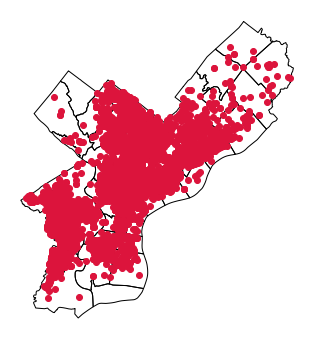

In [33]:
fig, ax = plt.subplots(figsize=(6, 6))

# ZIP codes
zip_codes.to_crs(epsg=3857).plot(ax=ax, facecolor="none", edgecolor="black")

# Shootings
shootings.plot(ax=ax, color="crimson")
ax.set_axis_off()

### Step 3: Make a (more useful) hex bin map

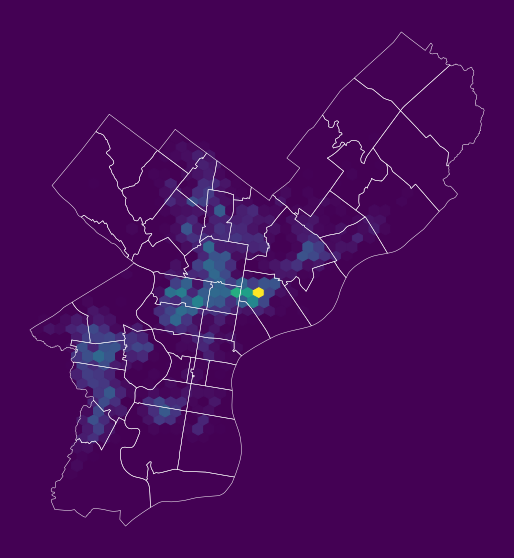

In [34]:
# initialize the axes
fig, ax = plt.subplots(figsize=(10, 10), facecolor=plt.get_cmap('viridis')(0))

# convert to Web Mercator and plot the hexbins 
x = shootings.geometry.x
y = shootings.geometry.y
ax.hexbin(x, y, gridsize=40, mincnt=1, cmap='viridis')

# overlay the ZIP codes
zip_codes.to_crs(epsg=3857).plot(ax=ax, 
                                 facecolor='none', 
                                 linewidth=0.5,
                                 edgecolor='white')

ax.set_axis_off()

## Count the total number of rows in a table

The `COUNT` function can be applied to count all rows.

In [36]:
query = "SELECT COUNT(*) FROM shootings"

In [37]:
params = dict(q=query)
r = requests.get(API_endpoint, params=params)

In [38]:
r.json()

{'rows': [{'count': 10777}],
 'time': 0.004,
 'fields': {'count': {'type': 'number', 'pgtype': 'int8'}},
 'total_rows': 1}

**Important:** always good to check how many rows you might be downloading before hand.

## Select all columns, limiting the total number returned

The `LIMIT` function limits the number of returned rows. It is very useful for taking a quick look at the format of a database.

In [39]:
# select the first 5
query = "SELECT * FROM shootings LIMIT 1"

In [40]:
params = dict(q=query, format="geojson")
r = requests.get(API_endpoint, params=params)

In [41]:
df = gpd.GeoDataFrame.from_features(r.json(), crs="EPSG:4326")
df

,geometry,cartodb_id,objectid,year,dc_key,code,date_,time,race,sex,age,wound,officer_involved,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal
0,POINT (-75.14880 39.94162),1,1338339,2019,201903066339.0,0411,2019-09-14T00:00:00Z,00:40:00,B,M,28,foot,N,N,N,300 BLOCK South St,0,-75.148805,39.94162,3,0,1,0


## Select by specific column values

In [42]:
shootings.head()

,geometry,objectid,year,dc_key,code,date_,time,race,sex,age,wound,officer_involved,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal,index_right,OBJECTID,Shape__Area,Shape__Length
0,POINT (-8365526.706 4857462.280),1338339,2019,201903066339.0,0411,2019-09-14T00:00:00Z,00:40:00,B,M,28,foot,N,N,N,300 BLOCK South St,0.0,-75.148805,39.941620,3,0.0,1.0,0.0,0,1,3.970706e+09,394751.12047
1,POINT (-8366966.847 4857706.934),1338340,2019,201903068722.0,0411,2019-09-22T00:00:00Z,04:15:00,B,M,18,buttocks,N,N,N,500 BLOCK S 12TH ST,0.0,-75.161742,39.943305,3,0.0,1.0,0.0,0,1,3.970706e+09,394751.12047
2,POINT (-8365974.545 4856172.613),1338341,2019,201903069547.0,0411,2019-09-24T00:00:00Z,22:50:00,B,M,22,multi,N,N,N,1200 BLOCK S 5th St,0.0,-75.152828,39.932737,3,0.0,1.0,0.0,0,1,3.970706e+09,394751.12047
3,POINT (-8366917.198 4854524.294),1338342,2019,201903069833.0,0300,2019-09-25T00:00:00Z,23:01:00,A,M,22,head,N,N,N,2200 BLOCK S Darien St,0.0,-75.161296,39.921382,3,1.0,0.0,0.0,0,1,3.970706e+09,394751.12047
4,POINT (-8366575.113 4854738.393),1338343,2019,201903070133.0,0411,2019-09-26T00:00:00Z,11:01:00,B,M,43,leg,N,N,N,2100 BLOCK S 7th St,0.0,-75.158223,39.922857,3,0.0,1.0,0.0,0,1,3.970706e+09,394751.12047


## Select nonfatal shootings only

In [43]:
query = "SELECT * FROM shootings WHERE fatal = 0" 

In [44]:
# Make the request
params = dict(q=query, format="geojson")
r = requests.get(API_endpoint, params=params)

# Make the GeoDataFrame
fatal = gpd.GeoDataFrame.from_features(r.json(), crs="EPSG:4326")
print("number of nonfatal shootings = ", len(fatal))

number of nonfatal shootings =  8580


## Select shootings in 2021

In [45]:
query = "SELECT * FROM shootings WHERE date_ > '12/31/20'"

In [46]:
# Make the request
params = dict(q=query, format="geojson")
r = requests.get(API_endpoint, params=params)

# Make the GeoDataFrame
this_year = gpd.GeoDataFrame.from_features(r.json(), crs="EPSG:4326")
print("number of shootings this year = ", len(this_year))

number of shootings this year =  1815


## The easier way: `carto2gpd`

- A small utility library to simplify the querying of CARTO APIs.
- The `get()` function will query the database
- The `get_size()` function will use `COUNT()` to get the total number of rows

https://github.com/PhiladelphiaController/carto2gpd

In [47]:
import carto2gpd

In [48]:
where = "date_ > '1/1/21' and fatal = 0"
df = carto2gpd.get(API_endpoint, 'shootings', where=where)

In [49]:
df.head()

,geometry,cartodb_id,objectid,year,dc_key,code,date_,time,race,sex,age,wound,officer_involved,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal
0,POINT (-75.19390 39.92143),365,1341975,2021,202101001269.0,411,2021-01-23T00:00:00Z,12:58:00,B,M,23,Abdomen,N,N,N,2500 BLOCK S 28TH ST,0,-75.193903,39.921432,1,0,1,0
1,POINT (-75.18311 39.92605),366,1341976,2021,202101002070.0,411,2021-02-05T00:00:00Z,23:59:00,B,M,36,Multiple,N,N,N,2200 BLOCK SNYDER AVE,0,-75.183108,39.926050,1,0,1,0
2,POINT (-75.18370 39.92973),368,1341978,2021,202101002864.0,411,2021-02-21T00:00:00Z,00:52:00,B,M,30,Leg,N,N,N,1800 BLOCK S 23RD ST,0,-75.183699,39.929734,1,0,1,0
3,POINT (-75.17987 39.92576),369,1341979,2021,202101003591.0,411,2021-03-04T00:00:00Z,10:25:00,B,M,28,Leg,N,N,N,2000 BLOCK SNYDER AVE,0,-75.179871,39.925759,1,0,1,0
4,POINT (-75.17232 39.92084),370,1341980,2021,202101004328.0,300,2021-03-14T00:00:00Z,22:03:00,W,M,27,Leg,N,N,N,1500 BLOCK RITNER ST,0,-75.172322,39.920842,1,0,1,0


In [50]:
# Limit results to the first 5
df = carto2gpd.get(API_endpoint, 'shootings', limit=5)

In [51]:
df

,geometry,cartodb_id,objectid,year,dc_key,code,date_,time,race,sex,age,wound,officer_involved,offender_injured,offender_deceased,location,latino,point_x,point_y,dist,inside,outside,fatal
0,POINT (-75.14880 39.94162),1,1338339,2019,201903066339.0,0411,2019-09-14T00:00:00Z,00:40:00,B,M,28,foot,N,N,N,300 BLOCK South St,0,-75.148805,39.941620,3,0,1,0
1,POINT (-75.16174 39.94331),2,1338340,2019,201903068722.0,0411,2019-09-22T00:00:00Z,04:15:00,B,M,18,buttocks,N,N,N,500 BLOCK S 12TH ST,0,-75.161742,39.943305,3,0,1,0
2,POINT (-75.15283 39.93274),3,1338341,2019,201903069547.0,0411,2019-09-24T00:00:00Z,22:50:00,B,M,22,multi,N,N,N,1200 BLOCK S 5th St,0,-75.152828,39.932737,3,0,1,0
3,POINT (-75.16130 39.92138),4,1338342,2019,201903069833.0,0300,2019-09-25T00:00:00Z,23:01:00,A,M,22,head,N,N,N,2200 BLOCK S Darien St,0,-75.161296,39.921382,3,1,0,0
4,POINT (-75.15822 39.92286),5,1338343,2019,201903070133.0,0411,2019-09-26T00:00:00Z,11:01:00,B,M,43,leg,N,N,N,2100 BLOCK S 7th St,0,-75.158223,39.922857,3,0,1,0


In [52]:
size = carto2gpd.get_size(API_endpoint, 'shootings')
print(size)

10777


## At-Home Exercise: Explore trends by month and day of week

### Step 1:

- Convert the date column to `DateTime` objects
- Add Month and Day of Week columns

In [53]:
# Convert the data column to a datetime object
shootings['date'] = pd.to_datetime(shootings['date_'])

In [54]:
# Add new columns: Month and Day of Week
shootings["Month"] = shootings["date"].dt.month
shootings["Day of Week"] = shootings["date"].dt.dayofweek # Monday is 0, Sunday is 6

### Step 2: Calculate number of shootings by month and day of week

Use the familiar Groupby --> size()

In [55]:
count = shootings.groupby(['Month', 'Day of Week']).size()
count = count.reset_index(name='Count')
count.head()

,Month,Day of Week,Count
0,1,0,87
1,1,1,106
2,1,2,95
3,1,3,96
4,1,4,108


### Step 3: Make a heatmap using `hvplot`

In [56]:
# Remember 0 is Monday and 6 is Sunday
count.hvplot.heatmap(
    x="Day of Week",
    y="Month",
    C="Count",
    cmap="viridis",
    width=400,
    height=500,
    flip_yaxis=True,
)

:HeatMap   [Day of Week,Month]   (Count)

### Trends: more shootings on the weekends and in the summer months

## API Example #1: Census

## US Census data is foundational

- Rich data sets with annual releases
- Decennial results plus American Community Survey (ACS) results
- Wide range of topics covered: sex, income, poverty, education, housing

## Getting census data (the old way)<br>American Factfinder

<center>
<a href=https://factfinder.census.gov><img src=attachment:Screen%20Shot%202019-02-19%20at%208.24.51%20PM.png width=700></img></a>
</center>
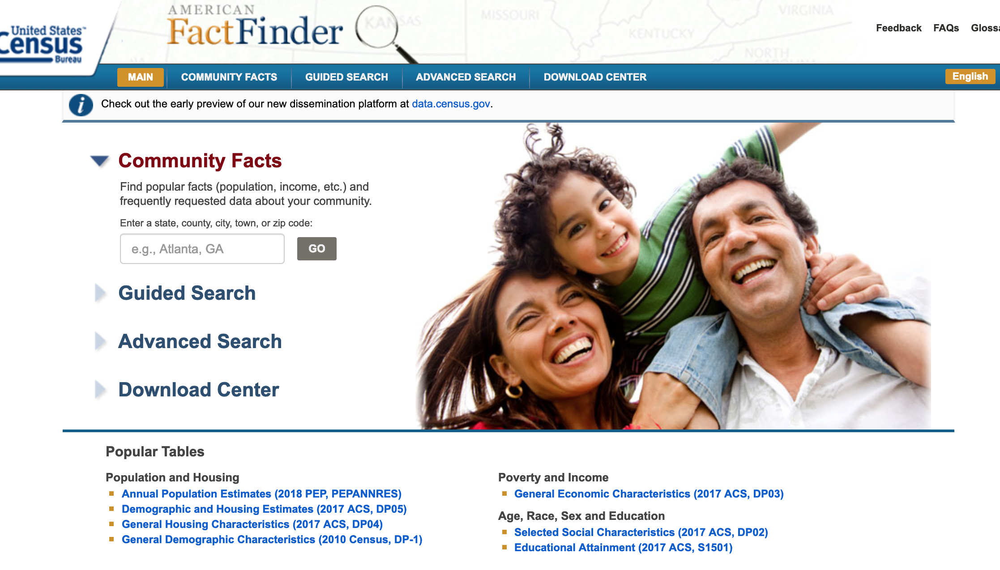

## Getting census data (the new way)<br>census.data.gov

<center>
    <a href=https://data.census.gov/><img src=attachment:Screen%20Shot%202019-02-19%20at%208.46.48%20PM.png width=700></img></a>
</center>
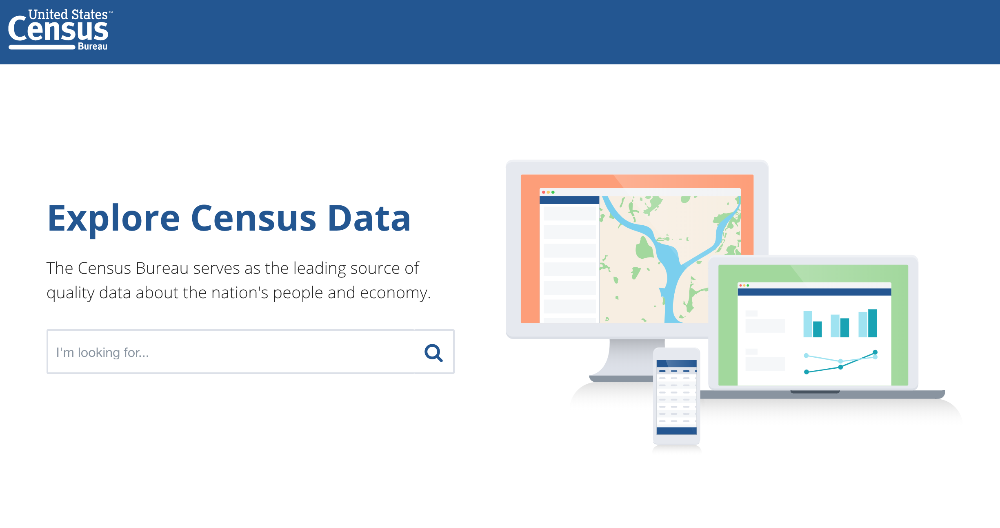

## Getting census data: other options

Several 3rd party options with easier interfaces for accessing census data

## Data USA

<center>
<a href="https://datausa.io">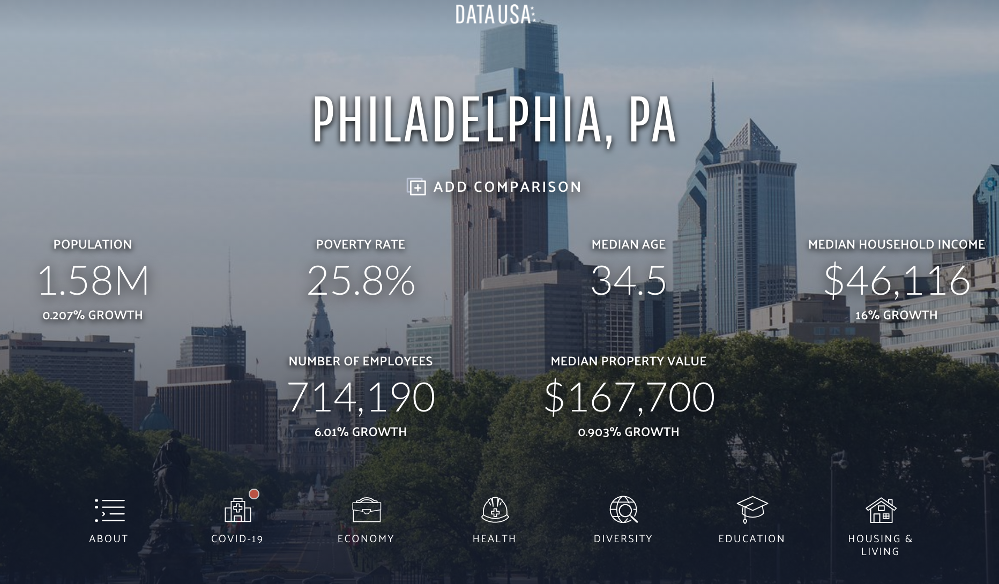</img></a>
</center>

## Census Reporter: 

<center>
<a href=https://censusreporter.org><img src=attachment:Screen%20Shot%202019-02-19%20at%208.39.08%20PM.png width=700></img></a>
</center>
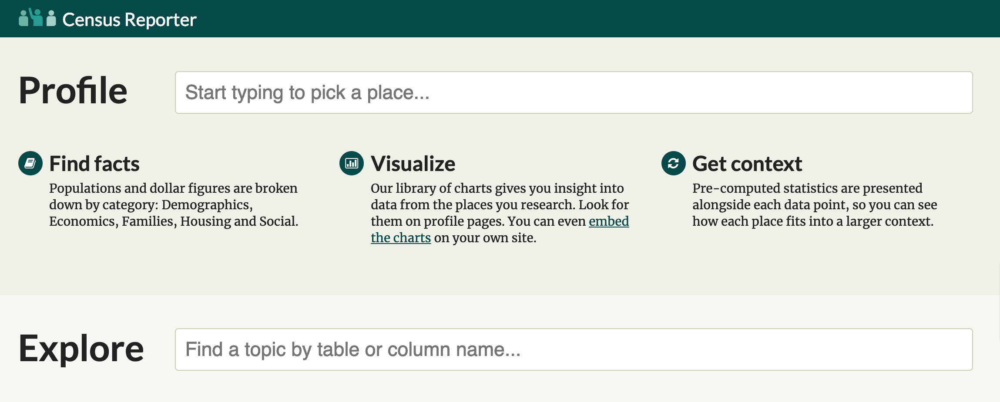

## NHGIS

<center>
<a href= https://www.nhgis.org><img src=attachment:Screen%20Shot%202019-02-19%20at%208.35.51%20PM.png width=700></img></a>
</center>
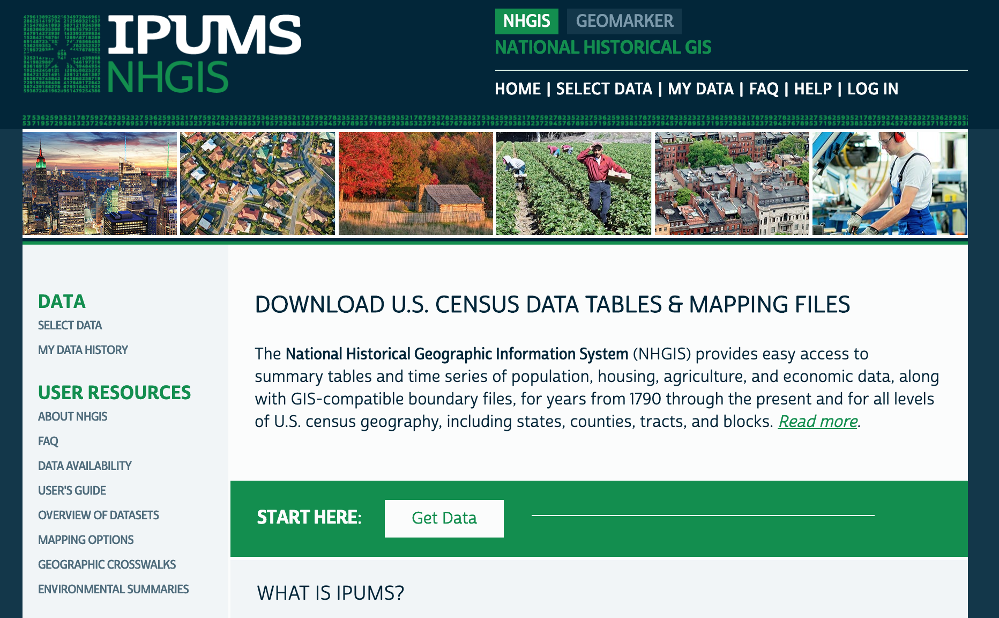

## Example: poverty data
<center>
    <a href="https://data.census.gov/cedsci/table?q=poverty%20status&g=0100000US.04000.001&tid=ACSST1Y2019.S1701&tp=false&hidePreview=true">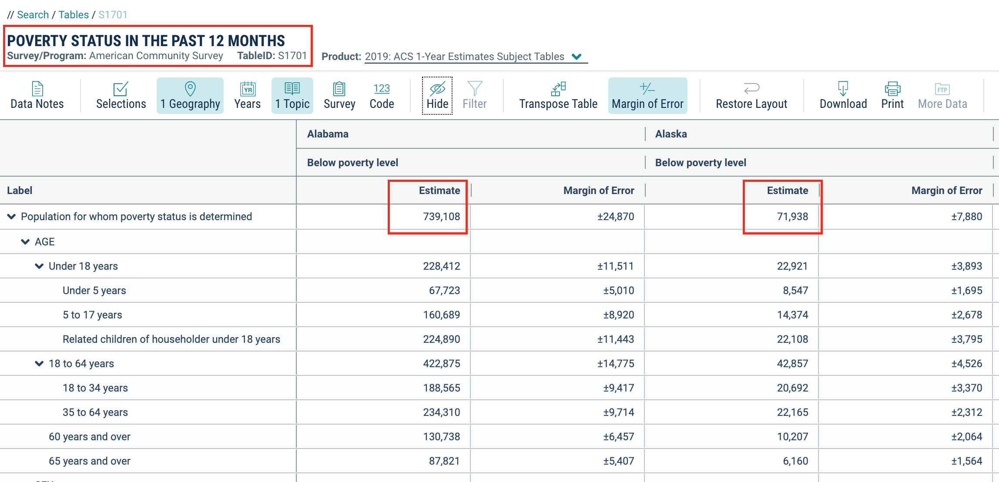</img></a>
</center>

## Via the API: 

https://api.census.gov/data/2019/acs/acs1/?get=NAME,B17001_002E&for=state:*

## Returns JSON

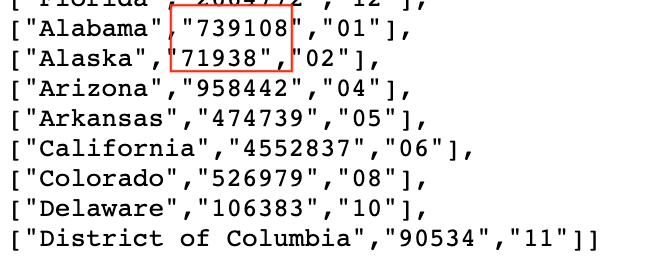

## How to find the right variable names?

The census provides web-based documentation:

- Overview of all data tables: https://api.census.gov/data.html
- All data tables for 2019: https://api.census.gov/data/2019.html
- All variables for 2019 ACS 5-year data set: https://api.census.gov/data/2019/acs/acs5/variables.html

## A detailed Census API guide

https://www.census.gov/data/developers/guidance/api-user-guide.html

## Accessing the API is easier from Python

Several packages provide easier Python interfaces to census data based on the census API.

We'll focus on **`cenpy` - "Explore and download data from Census APIs"**
 - [Documentation](https://cenpy-devs.github.io/cenpy/)
 - [GitHub](https://github.com/cenpy-devs/cenpy)

## Example: the racial "dot" map

<center>
    <img src=attachment:Screen%20Shot%202019-02-19%20at%2010.04.05%20PM.png width=900></img>
</center>

[Source](https://demographics.coopercenter.org/Racial-Dot-Map)
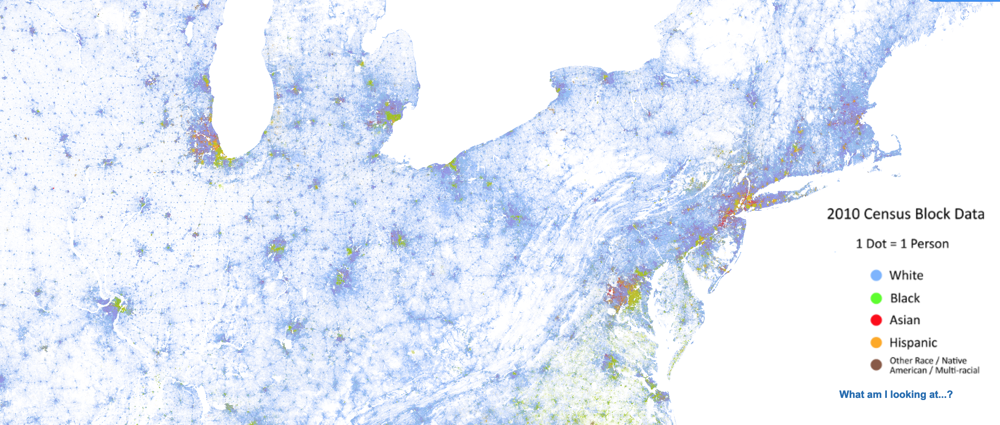

Let's make this for Philadelphia in Python!

In [57]:
# First step: import cenpy
import cenpy

## The "explorer" module

Functions to help you explore the Census API from Python

- [`cenpy.explorer.available`](https://cenpy-devs.github.io/cenpy/generated/cenpy.explorer.available.html#cenpy.explorer.available): Returns information about available datasets in Census API
- [`cenpy.explorer.explain`](https://cenpy-devs.github.io/cenpy/generated/cenpy.explorer.explain.html#cenpy.explorer.explain): Explain a specific Census dataset
- [`cenpy.explorer.fips_table`](https://cenpy-devs.github.io/cenpy/generated/cenpy.explorer.fips_table.html#cenpy.explorer.fips_table): Get a table of FIPS codes for a specific geography

### Step 1: Identify what dataset we want

- Today, we'll use the 5-year American Community Survey (latest available year: 2019)
- Other common datasets: 
    - 1-year ACS datasets as well (latest available year: 2019)
    - 10-year decennial survey (latest available year: 2010)

In [58]:
available = cenpy.explorer.available()

available.head()

,c_isMicrodata,c_isTimeseries,publisher,temporal,spatial,programCode,modified,keyword,contactPoint,distribution,description,bureauCode,accessLevel,title,c_isAvailable,c_isCube,c_isAggregate,c_valuesLink,c_groupsLink,c_examplesLink,c_tagsLink,c_variablesLink,c_geographyLink,c_dataset,vintage
ABSCB2017,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:007,2020-04-30 00:00:00.0,(),"{'fn': 'ASE Staff', 'hasEmail': 'mailto:erd.annual.survey.of.entrepreneurs@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2017/abscb', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}","The Annual Business Survey (ABS) provides information on selected economic and demographic characteristics for businesses and business owners by sex, ethnicity, race, and veteran status. Further, ...",006:07,public,Economic Surveys: Annual Business Survey: Annual Business Survey,True,NaN,True,https://api.census.gov/data/2017/abscb/values.json,https://api.census.gov/data/2017/abscb/groups.json,https://api.census.gov/data/2017/abscb/examples.json,https://api.census.gov/data/2017/abscb/tags.json,https://api.census.gov/data/2017/abscb/variables.json,https://api.census.gov/data/2017/abscb/geography.json,"(abscb,)",2017.0
ABSCB2018,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:007,2020-10-26 00:00:00.0,(),"{'fn': 'ASE Staff', 'hasEmail': 'mailto:Erd.annual.survey.of.entrepreneurs@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2018/abscb', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}","The Annual Business Survey (ABS) provides information on selected economic and demographic characteristics for businesses and business owners by sex, ethnicity, race, and veteran status. Further, ...",006:07,public,Economic Surveys: Annual Business Survey: Annual Business Survey,True,NaN,True,https://api.census.gov/data/2018/abscb/values.json,https://api.census.gov/data/2018/abscb/groups.json,https://api.census.gov/data/2018/abscb/examples.json,https://api.census.gov/data/2018/abscb/tags.json,https://api.census.gov/data/2018/abscb/variables.json,https://api.census.gov/data/2018/abscb/geography.json,"(abscb,)",2018.0
ABSCBO2017,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:007,2020-04-30 00:00:00.0,(),"{'fn': 'ASE Staff', 'hasEmail': 'mailto:erd.annual.survey.of.entrepreneurs@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2017/abscbo', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}","The Annual Business Survey (ABS) provides information on selected economic and demographic characteristics for businesses and business owners by sex, ethnicity, race, and veteran status. Further, ...",006:07,public,Economic Surveys: Annual Business Survey: Annual Business Survey,True,NaN,True,https://api.census.gov/data/2017/abscbo/values.json,https://api.census.gov/data/2017/abscbo/groups.json,https://api.census.gov/data/2017/abscbo/examples.json,https://api.census.gov/data/2017/abscbo/tags.json,https://api.census.gov/data/2017/abscbo/variables.json,https://api.census.gov/data/2017/abscbo/geography.json,"(abscbo,)",2017.0
ABSCBO2018,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:007,2020-10-26 00:00:00.0,(),"{'fn': 'ASE Staff', 'hasEmail': 'mailto:erd.annual.survey.of.entrepreneurs@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2018/abscbo', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}","The Annual Business Survey (ABS) provides information on selected economic and demographic characteristics for businesses and business owners by sex, ethnicity, race, and veteran status. Further, ...",006:07,public,Economic Surveys: Annual Business Survey: Annual Business Survey,True,NaN,True,https://api.census.gov/data/2018/abscbo/val

We can use the pandas [`filter()`](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.filter.html) to search for specific identifiers in the dataframe. 

In this case, let's search for the American Community Survey datasets. We'll match index labels using *regular expressions*. 

In particular, we'll search for labels that start with "ACS". In the language of regular expressions, we'll use the "^" to mean "match labels that start with"

For more info on regular expressions, the [documentation for the re module](https://docs.python.org/3/library/re.html) is a good place to start.

In [59]:
# Return a dataframe of all datasets that start with "ACS"
# Axis=0 means to filter the index labels!
acs = available.filter(regex="^ACS", axis=0)

acs

,c_isMicrodata,c_isTimeseries,publisher,temporal,spatial,programCode,modified,keyword,contactPoint,distribution,description,bureauCode,accessLevel,title,c_isAvailable,c_isCube,c_isAggregate,c_valuesLink,c_groupsLink,c_examplesLink,c_tagsLink,c_variablesLink,c_geographyLink,c_dataset,vintage
ACSCD1132011,NaN,NaN,U.S. Census Bureau,2011/2011,United States,006:004,2014-10-06,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2011/acs1/cd113', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is a nationwide survey designed to provide communities a fresh look at how they are changing. The ACS replaced the decennial census long form in 2010 and therea...,006:07,public,2011 American Community Survey 1-Year Profiles for the 113th Congressional Districts,True,NaN,True,https://api.census.gov/data/2011/acs1/cd113/values.json,https://api.census.gov/data/2011/acs1/cd113/groups.json,https://api.census.gov/data/2011/acs1/cd113/examples.json,https://api.census.gov/data/2011/acs1/cd113/tags.json,https://api.census.gov/data/2011/acs1/cd113/variables.json,https://api.census.gov/data/2011/acs1/cd113/geography.json,"(acs1, cd113)",2011.0
ACSCD1152015,NaN,NaN,U.S. Census Bureau,2015/2015,United States,006:004,2017-02-10,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2015/acs1/cd115', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,006:07,public,2015 American Community Survey 1-Year Data Profile 115th Congressional District,True,NaN,True,https://api.census.gov/data/2015/acs1/cd115/values.json,https://api.census.gov/data/2015/acs1/cd115/groups.json,https://api.census.gov/data/2015/acs1/cd115/examples.json,https://api.census.gov/data/2015/acs1/cd115/tags.json,https://api.census.gov/data/2015/acs1/cd115/variables.json,https://api.census.gov/data/2015/acs1/cd115/geography.json,"(acs1, cd115)",2015.0
ACSCP1Y2010,NaN,NaN,U.S. Census Bureau,unidentified,United States,006:004,2018-09-18 00:00:00.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2010/acs/acs1/cprofile', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API end...",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,NaN,NaN,ACS 1-Year Comparison Profiles,True,True,True,https://api.census.gov/data/2010/acs/acs1/cprofile/values.json,https://api.census.gov/data/2010/acs/acs1/cprofile/groups.json,https://api.census.gov/data/2010/acs/acs1/cprofile/examples.json,https://api.census.gov/data/2010/acs/acs1/cprofile/tags.json,https://api.census.gov/data/2010/acs/acs1/cprofile/variables.json,https://api.census.gov/data/2010/acs/acs1/cprofile/geography.json,"(acs, acs1, cprofile)",2010.0
ACSCP1Y2011,NaN,NaN,U.S. Census Bureau,unidentified,United States,006:004,2018-09-18 00:00:00.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2011/acs/acs1/cprofile', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API end...",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan inves

Many flavors of ACS datasets are available — we want to use the *detailed tables* version, specifically the 5-year survey. 

The relevant identifiers start with: "ACSDT5Y".

In [60]:
# Return a dataframe of all datasets that start with "ACSDT5Y"
available.filter(regex="^ACSDT5Y", axis=0)

,c_isMicrodata,c_isTimeseries,publisher,temporal,spatial,programCode,modified,keyword,contactPoint,distribution,description,bureauCode,accessLevel,title,c_isAvailable,c_isCube,c_isAggregate,c_valuesLink,c_groupsLink,c_examplesLink,c_tagsLink,c_variablesLink,c_geographyLink,c_dataset,vintage
ACSDT5Y2009,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:004,2019-08-27 13:11:18.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'mailto:acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2009/acs/acs5', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,NaN,NaN,American Community Survey: 5-Year Estimates: Detailed Tables 5-Year,True,True,True,https://api.census.gov/data/2009/acs/acs5/values.json,https://api.census.gov/data/2009/acs/acs5/groups.json,https://api.census.gov/data/2009/acs/acs5/examples.json,https://api.census.gov/data/2009/acs/acs5/tags.json,https://api.census.gov/data/2009/acs/acs5/variables.json,https://api.census.gov/data/2009/acs/acs5/geography.json,"(acs, acs5)",2009.0
ACSDT5Y2010,NaN,NaN,U.S. Census Bureau,unidentified,United States,006:004,2018-07-04 00:00:00.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'mailto:acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2010/acs/acs5', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,NaN,NaN,ACS 5-Year Detailed Tables,True,True,True,https://api.census.gov/data/2010/acs/acs5/values.json,https://api.census.gov/data/2010/acs/acs5/groups.json,https://api.census.gov/data/2010/acs/acs5/examples.json,https://api.census.gov/data/2010/acs/acs5/tags.json,https://api.census.gov/data/2010/acs/acs5/variables.json,https://api.census.gov/data/2010/acs/acs5/geography.json,"(acs, acs5)",2010.0
ACSDT5Y2011,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:004,2018-07-04 00:00:00.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'mailto:acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2011/acs/acs5', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,006:07,public,ACS 5-Year Detailed Tables,True,True,True,https://api.census.gov/data/2011/acs/acs5/values.json,https://api.census.gov/data/2011/acs/acs5/groups.json,https://api.census.gov/data/2011/acs/acs5/examples.json,https://api.census.gov/data/2011/acs/acs5/tags.json,https://api.census.gov/data/2011/acs/acs5/variables.json,https://api.census.gov/data/2011/acs/acs5/geography.json,"(acs, acs5)",2011.0
ACSDT5Y2012,NaN,NaN,U.S. Census Bureau,unidentified,NaN,006:004,2018-07-04 00:00:00.0,(),"{'fn': 'American Community Survey Office', 'hasEmail': 'mailto:acso.users.support@census.gov'}","{'@type': 'dcat:Distribution', 'accessURL': 'https://api.census.gov/data/2012/acs/acs5', 'description': 'API endpoint', 'format': 'API', 'mediaType': 'application/json', 'title': 'API endpoint'}",The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a br...,006:07,public,ACS 5-Year Detailed Tables,True,True,True,https://api.census.gov/data/2012/acs/acs5/values.json,https:

Let's use the latest available data (2019). We can use the `explain()` function to print out a description of the dataset:

In [61]:
cenpy.explorer.explain("ACSDT5Y2019")

{'American Community Survey: 5-Year Estimates: Detailed Tables 5-Year': 'The American Community Survey (ACS) is an ongoing survey that provides data every year -- giving communities the current information they need to plan investments and services. The ACS covers a broad range of topics about social, economic, demographic, and housing characteristics of the U.S. population. Summary files include the following geographies: nation, all states (including DC and Puerto Rico), all metropolitan areas, all congressional districts (116th Congress), all counties, all places, and all tracts and block groups. Summary files contain the most detailed cross-tabulations, many of which are published down to block groups. The data are population and housing counts. There are over 64,000 variables in this dataset.'}

### Step 2: Initialize the API connection

Use the `cenpy.remote.APIConnection` object, and pass it the name of the dataset.

In [62]:
acs = cenpy.remote.APIConnection("ACSDT5Y2019")

### Step 3: Find the variables we want to load

The `.variables` attribute stores the available variables (across all Census tables). 

We can use the `varslike()` function to search the `variables` dataframe (it's just a simple wrapper around the pandas `filter()` function).

In [63]:
len(acs.variables)

27080

In [64]:
acs.variables.head(n=10)

,label,concept,predicateType,group,limit,predicateOnly,attributes,required
for,Census API FIPS 'for' clause,Census API Geography Specification,fips-for,N/A,0,True,NaN,NaN
in,Census API FIPS 'in' clause,Census API Geography Specification,fips-in,N/A,0,True,NaN,NaN
ucgid,Uniform Census Geography Identifier clause,Census API Geography Specification,ucgid,N/A,0,True,NaN,NaN
B24022_060E,Estimate!!Total:!!Female:!!Service occupations:!!Food preparation and serving related occupations,"SEX BY OCCUPATION AND MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2019 INFLATION-ADJUSTED DOLLARS) FOR THE FULL-TIME, YEAR-ROUND CIVILIAN EMPLOYED POPULATION 16 YEARS AND OVER",int,B24022,0,NaN,"B24022_060EA,B24022_060M,B24022_060MA",NaN
B19001B_014E,"Estimate!!Total:!!$100,000 to $124,999",HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2019 INFLATION-ADJUSTED DOLLARS) (BLACK OR AFRICAN AMERICAN ALONE HOUSEHOLDER),int,B19001B,0,NaN,"B19001B_014EA,B19001B_014M,B19001B_014MA",NaN
B07007PR_019E,Estimate!!Total:!!Moved from different municipio:!!Foreign born:!!Naturalized U.S. citizen,GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY CITIZENSHIP STATUS FOR CURRENT RESIDENCE IN PUERTO RICO,int,B07007PR,0,NaN,"B07007PR_019EA,B07007PR_019M,B07007PR_019MA",NaN
B19101A_004E,"Estimate!!Total:!!$15,000 to $19,999",FAMILY INCOME IN THE PAST 12 MONTHS (IN 2019 INFLATION-ADJUSTED DOLLARS) (WHITE ALONE HOUSEHOLDER),int,B19101A,0,NaN,"B19101A_004EA,B19101A_004M,B19101A_004MA",NaN
B24022_061E,Estimate!!Total:!!Female:!!Service occupations:!!Building and grounds cleaning and maintenance occupations,"SEX BY OCCUPATION AND MEDIAN EARNINGS IN THE PAST 12 MONTHS (IN 2019 INFLATION-ADJUSTED DOLLARS) FOR THE FULL-TIME, YEAR-ROUND CIVILIAN EMPLOYED POPULATION 16 YEARS AND OVER",int,B24022,0,NaN,"B24022_061EA,B24022_061M,B24022_061MA",NaN
B19001B_013E,"Estimate!!Total:!!$75,000 to $99,999",HOUSEHOLD INCOME IN THE PAST 12 MONTHS (IN 2019 INFLATION-ADJUSTED DOLLARS) (BLACK OR AFRICAN AMERICAN ALONE HOUSEHOLDER),int,B19001B,0,NaN,"B19001B_013EA,B19001B_013M,B19001B_013MA",NaN
B07007PR_018E,Estimate!!Total:!!Moved from different municipio:!!Foreign born:,GEOGRAPHICAL MOBILITY IN THE PAST YEAR BY CITIZENSHIP STATUS FOR CURRENT RESIDENCE IN PUERTO RICO,int,B07007PR,0,NaN,"B07007PR_018EA,B07007PR_018M,B07007PR_018MA",NaN


We're interested in variables about hispanic origin broken down by race — let's see if we can find the variables where the "Concept" column starts with "RACE"

In [65]:
acs.varslike?

In [66]:
acs.varslike("HISPANIC OR LATINO ORIGIN BY RACE", by='concept').sort_index() # searches along concept column

,label,concept,predicateType,group,limit,predicateOnly,attributes,required
B03002_001E,Estimate!!Total:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_001EA,B03002_001M,B03002_001MA",NaN
B03002_002E,Estimate!!Total:!!Not Hispanic or Latino:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_002EA,B03002_002M,B03002_002MA",NaN
B03002_003E,Estimate!!Total:!!Not Hispanic or Latino:!!White alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_003EA,B03002_003M,B03002_003MA",NaN
B03002_004E,Estimate!!Total:!!Not Hispanic or Latino:!!Black or African American alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_004EA,B03002_004M,B03002_004MA",NaN
B03002_005E,Estimate!!Total:!!Not Hispanic or Latino:!!American Indian and Alaska Native alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_005EA,B03002_005M,B03002_005MA",NaN
B03002_006E,Estimate!!Total:!!Not Hispanic or Latino:!!Asian alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_006EA,B03002_006M,B03002_006MA",NaN
B03002_007E,Estimate!!Total:!!Not Hispanic or Latino:!!Native Hawaiian and Other Pacific Islander alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_007EA,B03002_007M,B03002_007MA",NaN
B03002_008E,Estimate!!Total:!!Not Hispanic or Latino:!!Some other race alone,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_008EA,B03002_008M,B03002_008MA",NaN
B03002_009E,Estimate!!Total:!!Not Hispanic or Latino:!!Two or more races:,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_009EA,B03002_009M,B03002_009MA",NaN
B03002_010E,Estimate!!Total:!!Not Hispanic or Latino:!!Two or more races:!!Two races including Some other race,HISPANIC OR LATINO ORIGIN BY RACE,int,B03002,0,NaN,"B03002_010EA,B03002_010M,B03002_010MA",NaN


It looks like the table we want is "B03002" — we can also easily filter for all variables in this table

In [67]:
variables = [
    "NAME",
    "B03002_001E", # Total
    "B03002_003E", # Not Hispanic, White
    "B03002_004E", # Not Hispanic, Black
    "B03002_005E", # Not Hispanic, American Indian
    "B03002_006E", # Not Hispanic, Asian
    "B03002_007E", # Not Hispanic, Native Hawaiian
    "B03002_008E", # Not Hispanic, Other
    "B03002_009E", # Not Hispanic, Two or More Races
    "B03002_012E", # Hispanic
]

Note: we've also include the "NAME" variable which returns the name of the Census geography we are querying for

### Step 4: Identify the geographies to use

The Census API use heirarchy of geographies when requesting data.

For example, you cannot just request data for a specific county — you need to specify the state *and* the county.

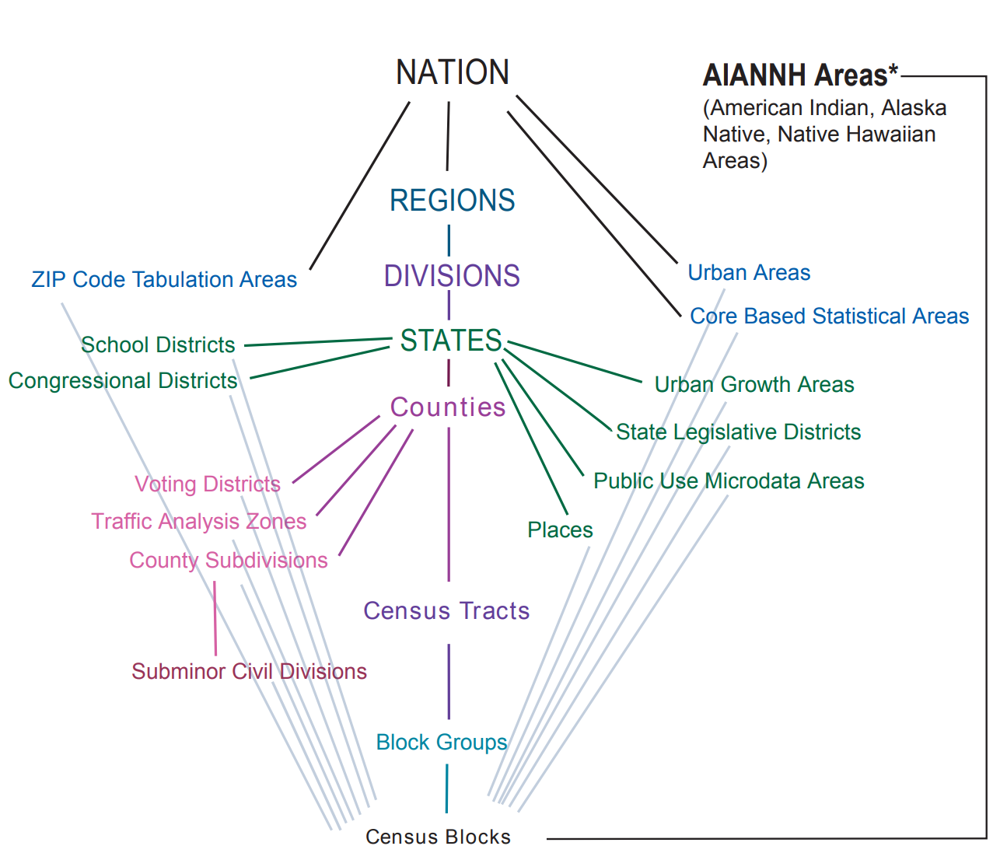</img>

### Common hierarchies

- State --> county
- State --> place (e.g., cities)
- State --> county --> tract
- State --> county --> tract --> block group

### Tip: Use the `.geographies` attribute

This allows you to see:

1. What geographies are available for a specific dataset
1. The other required geographies in the heirarchy

In [69]:
acs.geographies['fips']

,name,geoLevelDisplay,referenceDate,requires,wildcard,optionalWithWCFor
0,us,010,2019-01-01,NaN,NaN,NaN
1,region,020,2019-01-01,NaN,NaN,NaN
2,division,030,2019-01-01,NaN,NaN,NaN
3,state,040,2019-01-01,NaN,NaN,NaN
4,county,050,2019-01-01,[state],[state],state
5,county subdivision,060,2019-01-01,"[state, county]",[county],county
6,subminor civil division,067,2019-01-01,"[state, county, county subdivision]",NaN,NaN
7,place/remainder (or part),070,2019-01-01,"[state, county, county subdivision]",NaN,NaN
8,tract,140,2019-01-01,"[state, county]",[county],county
9,block group,150,2019-01-01,"[state, county, tract]","[county, tract]",tract


For the racial dot map, we'll use the most granular available geography: block group.

The hierarchy is: state --> county --> tract --> block group but we can use the `*` operator for tracts so we'll need to know the **FIPS codes for PA and Philadelphia County**

In [70]:
counties = cenpy.explorer.fips_table("COUNTY")
counties.head()

,0,1,2,3,4
0,AL,1,1,Autauga County,H1
1,AL,1,3,Baldwin County,H1
2,AL,1,5,Barbour County,H1
3,AL,1,7,Bibb County,H1
4,AL,1,9,Blount County,H1


In [71]:
# Trim to just Philadelphia
# Search for rows where name contains "Philadelphia"
counties.loc[ counties[3].str.contains("Philadelphia") ]

,0,1,2,3,4
2294,PA,42,101,Philadelphia County,H6


For Philadelphia County, the FIPS codes are:

- Philadelphia County: "101" 
- PA: "42"

In [72]:
philly_county_code = "101"
pa_state_code = "42"

You can also look up FIPS codes on Google! Wikipedia is usually a trustworthy source...

### Step 5: Build the query (finally)

We'll use the `.query()` function, which takes the following arguments:

1. `cols` - the list of variables desired from the dataset
1. `geo_unit` - string denoting the smallest geographic unit; syntax is "name:FIPS"
1. `geo_filter` - dictionary containing groupings of geo_units, if required by the hierarchy


In [73]:
philly_demo_data = acs.query(
    cols=variables,
    geo_unit="block group:*",
    geo_filter={"state": pa_state_code, 
                "county": philly_county_code, 
                "tract": "*"},
)


philly_demo_data.head()

,NAME,B03002_001E,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,B03002_012E,state,county,tract,block group
0,"Block Group 1, Census Tract 9807, Philadelphia County, Pennsylvania",0,0,0,0,0,0,0,0,0,42,101,980700,1
1,"Block Group 3, Census Tract 27.01, Philadelphia County, Pennsylvania",1955,904,262,0,502,0,0,36,251,42,101,002701,3
2,"Block Group 2, Census Tract 337.01, Philadelphia County, Pennsylvania",976,654,0,0,99,0,41,103,79,42,101,033701,2
3,"Block Group 3, Census Tract 337.01, Philadelphia County, Pennsylvania",3859,1594,477,0,305,0,0,182,1301,42,101,033701,3
4,"Block Group 2, Census Tract 205, Philadelphia County, Pennsylvania",1017,36,796,0,124,0,0,0,61,42,101,020500,2


### Important: data is returned as strings rather than numeric values

In [74]:
for variable in variables:
    
    # Convert all variables EXCEPT for NAME
    if variable != "NAME":
        philly_demo_data[variable] = philly_demo_data[variable].astype(float)

### What if we mess up the geographic hierarchy?

If you forget to include required parts of the geography heirarchy, you'll get an error!

In [75]:
acs.query(
    cols=variables,
    geo_unit="block group:*",
    geo_filter={"state": pa_state_code},
)

HTTPError: 400 error: unknown/unsupported geography heirarchy

## We need the block group geometries too!

`cenpy` includes an interface to the Census' [Tiger] shapefile database.

In [76]:
cenpy.tiger.available()

[{'name': 'AIANNHA', 'type': 'MapServer'},
 {'name': 'CBSA', 'type': 'MapServer'},
 {'name': 'Hydro', 'type': 'MapServer'},
 {'name': 'Labels', 'type': 'MapServer'},
 {'name': 'Legislative', 'type': 'MapServer'},
 {'name': 'Places_CouSub_ConCity_SubMCD', 'type': 'MapServer'},
 {'name': 'PUMA_TAD_TAZ_UGA_ZCTA', 'type': 'MapServer'},
 {'name': 'Region_Division', 'type': 'MapServer'},
 {'name': 'School', 'type': 'MapServer'},
 {'name': 'Special_Land_Use_Areas', 'type': 'MapServer'},
 {'name': 'State_County', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2012', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2013', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2014', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2015', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2016', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2017', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2018', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2019', 'type': 'MapServer'},
 {'name': 'tigerWMS_ACS2021', 'type': 'MapServer'},

Set the ACS2019 database as the desired GeoService

In [77]:
acs.set_mapservice("tigerWMS_ACS2019")

Connection to American Community Survey: 5-Year Estimates: Detailed Tables 5-Year(ID: https://api.census.gov/data/id/ACSDT5Y2019)
With MapServer: Census ACS 2019 WMS

The map service has many different layers — select the layer for our desired geography

In [78]:
acs.mapservice.layers

[(ESRILayer) 2010 Census Public Use Microdata Areas,
 (ESRILayer) 2010 Census Public Use Microdata Areas Labels,
 (ESRILayer) 2010 Census ZIP Code Tabulation Areas,
 (ESRILayer) 2010 Census ZIP Code Tabulation Areas Labels,
 (ESRILayer) Tribal Census Tracts,
 (ESRILayer) Tribal Census Tracts Labels,
 (ESRILayer) Tribal Block Groups,
 (ESRILayer) Tribal Block Groups Labels,
 (ESRILayer) Census Tracts,
 (ESRILayer) Census Tracts Labels,
 (ESRILayer) Census Block Groups,
 (ESRILayer) Census Block Groups Labels,
 (ESRILayer) Unified School Districts,
 (ESRILayer) Unified School Districts Labels,
 (ESRILayer) Secondary School Districts,
 (ESRILayer) Secondary School Districts Labels,
 (ESRILayer) Elementary School Districts,
 (ESRILayer) Elementary School Districts Labels,
 (ESRILayer) Estates,
 (ESRILayer) Estates Labels,
 (ESRILayer) County Subdivisions,
 (ESRILayer) County Subdivisions Labels,
 (ESRILayer) Subbarrios,
 (ESRILayer) Subbarrios Labels,
 (ESRILayer) Consolidated Cities,
 (ES

In [79]:
acs.mapservice.layers[10]

(ESRILayer) Census Block Groups

Query the service using the `.query()` function.

We can use a SQL command to request census tracts only for Philadelphia county by specifying the other geographies in the hierachy (in this case, state and county)

In [80]:
acs.mapservice.layers[10].variables

,name,type,alias,length,domain
0,MTFCC,esriFieldTypeString,MTFCC,5.0,None
1,OID,esriFieldTypeString,OID,22.0,None
2,GEOID,esriFieldTypeString,GEOID,12.0,None
3,STATE,esriFieldTypeString,STATE,2.0,None
4,COUNTY,esriFieldTypeString,COUNTY,3.0,None
5,TRACT,esriFieldTypeString,TRACT,6.0,None
6,BLKGRP,esriFieldTypeString,BLKGRP,1.0,None
7,BASENAME,esriFieldTypeString,BASENAME,100.0,None
8,NAME,esriFieldTypeString,NAME,100.0,None
9,LSADC,esriFieldTypeString,LSADC,2.0,None


In [81]:
# Use SQL to return geometries only for Philadelphia County in PA
where_clause = f"STATE = {pa_state_code} AND COUNTY = {philly_county_code}"

# Query for block groups
philly_block_groups = acs.mapservice.layers[10].query(where=where_clause)

/Users/nhand/opt/miniconda3/envs/musa-550-fall-2021/lib/python3.8/site-packages/pyproj/crs/crs.py:68: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [82]:
philly_block_groups.head()

,MTFCC,OID,GEOID,STATE,COUNTY,TRACT,BLKGRP,BASENAME,NAME,LSADC,FUNCSTAT,AREALAND,AREAWATER,CENTLAT,CENTLON,INTPTLAT,INTPTLON,OBJECTID,geometry
0,G5030,20859508776554,421010090004,42,101,009000,4,4,Block Group 4,BG,S,127839,0,+39.9572985,-075.1914596,+39.9572985,-075.1914596,3312,"POLYGON ((-8370567.253 4859618.633, -8370565.472 4859631.123, -8370556.900 4859684.711, -8370536.195 4859812.656, -8370534.859 4859823.548, -8370528.514 4859863.631, -8370523.616 4859893.548, -837..."
1,G5030,20859508883786,421010188002,42,101,018800,2,2,Block Group 2,BG,S,59722,0,+39.9975515,-075.1023594,+39.9975515,-075.1023594,3294,"POLYGON ((-8360576.329 4865634.793, -8360515.326 4865677.515, -8360459.666 4865714.861, -8360400.110 4865756.856, -8360319.292 4865808.298, -8360276.990 4865744.214, -8360231.238 4865678.968, -836..."
2,G5030,20859508883559,421010382002,42,101,038200,2,2,Block Group 2,BG,S,250653,0,+39.9901972,-075.1026825,+39.9901972,-075.1026825,3295,"POLYGON ((-8360910.732 4864437.488, -8360638.556 4864623.032, -8360383.078 4864797.245, -8360127.377 4864971.898, -8360056.466 4864866.845, -8360015.946 4864806.690, -8359971.084 4864739.561, -835..."
3,G5030,20859508934956,421010090001,42,101,009000,1,1,Block Group 1,BG,S,67291,0,+39.9616601,-075.1923616,+39.9616601,-075.1923616,3741,"POLYGON ((-8370579.498 4860512.096, -8370429.328 4860533.446, -8370392.593 4860539.110, -8370276.820 4860555.377, -8370267.136 4860555.668, -8370251.551 4860447.175, -8370236.857 4860340.427, -837..."
4,G5030,20859508776526,421010090002,42,101,009000,2,2,Block Group 2,BG,S,83926,0,+39.9597607,-075.1914912,+39.9597607,-075.1914912,3742,"POLYGON ((-8370547.215 4860205.940, -8370524.172 4860209.861, -8370508.588 4860211.749, -8370433.447 4860222.061, -8370403.613 4860226.853, -8370397.268 4860228.015, -8370377.008 4860230.484, -837..."


### Merge the demographic data with geometries

Merge based on multiple columns: state, county, tract, and block group IDs.

The relevant columns are: 

- "STATE", "COUNTY", "TRACT", "BLKGRP" in the spatial data
- "state", "county", "tract", "block group" in the non-spatial data

In [83]:
philly_demo_final = philly_block_groups.merge(
    philly_demo_data,
    left_on=["STATE", "COUNTY", "TRACT", "BLKGRP"],
    right_on=["state", "county", "tract", "block group"],
)

In [84]:
philly_demo_final.head()

,MTFCC,OID,GEOID,STATE,COUNTY,TRACT,BLKGRP,BASENAME,NAME_x,LSADC,FUNCSTAT,AREALAND,AREAWATER,CENTLAT,CENTLON,INTPTLAT,INTPTLON,OBJECTID,geometry,NAME_y,B03002_001E,B03002_003E,B03002_004E,B03002_005E,B03002_006E,B03002_007E,B03002_008E,B03002_009E,B03002_012E,state,county,tract,block group
0,G5030,20859508776554,421010090004,42,101,009000,4,4,Block Group 4,BG,S,127839,0,+39.9572985,-075.1914596,+39.9572985,-075.1914596,3312,"POLYGON ((-8370567.253 4859618.633, -8370565.472 4859631.123, -8370556.900 4859684.711, -8370536.195 4859812.656, -8370534.859 4859823.548, -8370528.514 4859863.631, -8370523.616 4859893.548, -837...","Block Group 4, Census Tract 90, Philadelphia County, Pennsylvania",1970.0,1264.0,141.0,0.0,340.0,0.0,6.0,56.0,163.0,42,101,009000,4
1,G5030,20859508883786,421010188002,42,101,018800,2,2,Block Group 2,BG,S,59722,0,+39.9975515,-075.1023594,+39.9975515,-075.1023594,3294,"POLYGON ((-8360576.329 4865634.793, -8360515.326 4865677.515, -8360459.666 4865714.861, -8360400.110 4865756.856, -8360319.292 4865808.298, -8360276.990 4865744.214, -8360231.238 4865678.968, -836...","Block Group 2, Census Tract 188, Philadelphia County, Pennsylvania",1290.0,282.0,622.0,0.0,0.0,0.0,0.0,1.0,385.0,42,101,018800,2
2,G5030,20859508883559,421010382002,42,101,038200,2,2,Block Group 2,BG,S,250653,0,+39.9901972,-075.1026825,+39.9901972,-075.1026825,3295,"POLYGON ((-8360910.732 4864437.488, -8360638.556 4864623.032, -8360383.078 4864797.245, -8360127.377 4864971.898, -8360056.466 4864866.845, -8360015.946 4864806.690, -8359971.084 4864739.561, -835...","Block Group 2, Census Tract 382, Philadelphia County, Pennsylvania",1029.0,718.0,0.0,0.0,52.0,0.0,0.0,32.0,227.0,42,101,038200,2
3,G5030,20859508934956,421010090001,42,101,009000,1,1,Block Group 1,BG,S,67291,0,+39.9616601,-075.1923616,+39.9616601,-075.1923616,3741,"POLYGON ((-8370579.498 4860512.096, -8370429.328 4860533.446, -8370392.593 4860539.110, -8370276.820 4860555.377, -8370267.136 4860555.668, -8370251.551 4860447.175, -8370236.857 4860340.427, -837...","Block Group 1, Census Tract 90, Philadelphia County, Pennsylvania",455.0,338.0,9.0,0.0,54.0,0.0,0.0,11.0,43.0,42,101,009000,1
4,G5030,20859508776526,421010090002,42,101,009000,2,2,Block Group 2,BG,S,83926,0,+39.9597607,-075.1914912,+39.9597607,-075.1914912,3742,"POLYGON ((-8370547.215 4860205.940, -8370524.172 4860209.861, -8370508.588 4860211.749, -8370433.447 4860222.061, -8370403.613 4860226.853, -8370397.268 4860228.015, -8370377.008 4860230.484, -837...","Block Group 2, Census Tract 90, Philadelphia County, Pennsylvania",2273.0,1337.0,176.0,0.0,571.0,0.0,0.0,73.0,116.0,42,101,009000,2


## Plot it to make sure it makes sense!

Using `geopandas`...

In [85]:
# Check the CRS
philly_demo_final.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

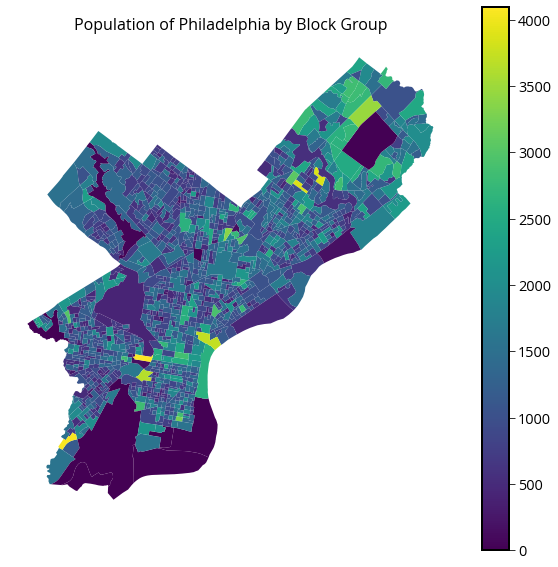

In [86]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot the choropleth
philly_demo_final.plot(ax=ax, column='B03002_001E', legend=True)

# Format
ax.set_title("Population of Philadelphia by Block Group", fontsize=16)
ax.set_axis_off()

## Or using `hvplot`...

In [87]:
cols = ['NAME_x', 'B03002_001E', 'geometry']
philly_demo_final[cols].hvplot(c='B03002_001E',
                              geo=True, 
                              crs=3857, 
                              legend=True,
                              width=600, 
                              height=400, 
                              cmap='viridis')

:Polygons   [Longitude,Latitude]   (B03002_001E)

## Let's prep the data for the dot map

1. Rename columns to more user-friendly versions
1. Add a general "Other" category

In [88]:
# Rename columns
philly_demo_final = philly_demo_final.rename(
    columns={
        "B03002_001E": "Total",  # Total
        "B03002_003E": "White",  # Not Hispanic, White
        "B03002_004E": "Black",  # Not Hispanic, Black
        "B03002_005E": "AI/AN",  # Not Hispanic, American Indian
        "B03002_006E": "Asian",  # Not Hispanic, Asian
        "B03002_007E": "NH/PI",  # Not Hispanic, Native Hawaiian
        "B03002_008E": "Other_",  # Not Hispanic, Other
        "B03002_009E": "Two Plus",  # Not Hispanic, Two or More Races
        "B03002_012E": "Hispanic",  # Hispanic
    }
)

In [89]:
# Add an "Other" column 
cols = ['AI/AN', 'NH/PI','Other_', 'Two Plus']
philly_demo_final['Other'] = philly_demo_final[cols].sum(axis=1)

## Define a function to create random points

Given a polygon, create randomly distributed points that fall within the polygon.

In [90]:
def random_points_in_polygon(number, polygon):
    """
    Generate a random number of points within the 
    specified polygon.
    """
    points = []
    min_x, min_y, max_x, max_y = polygon.bounds
    i= 0
    while i < number:
        point = Point(np.random.uniform(min_x, max_x), np.random.uniform(min_y, max_y))
        if polygon.contains(point):
            points.append(point)
            i += 1
    return points

## Random points example

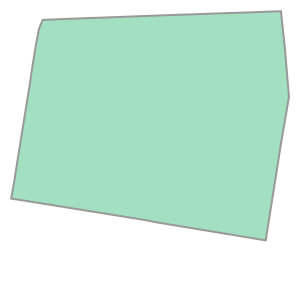

In [91]:
# get the first block group polygon in the data set
geo = philly_demo_final.iloc[0].geometry

geo

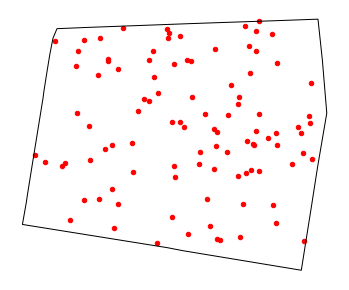

In [92]:
fig, ax = plt.subplots(figsize=(6, 6))

# Generate some random points
random_points = random_points_in_polygon(100, geo)

# Plot random points
gpd.GeoSeries(random_points).plot(ax=ax, markersize=20, color="red")

# Plot boundary of block group
gpd.GeoSeries([geo]).plot(ax=ax, facecolor="none", edgecolor="black")

ax.set_axis_off()

In [93]:
def generate_dot_map(data, people_per_dot):
    """
    Given a GeoDataFrame with demographic columns, generate a dot 
    map according to the population in each geometry.
    """
    results = []
    for field in ["White", "Hispanic", "Black", "Asian", "Other"]:

        # generate random points
        pts = data.apply(
            lambda row: random_points_in_polygon(
                row[field] / people_per_dot, row["geometry"]
            ),
            axis=1,
        )

        # combine into single GeoSeries
        pts = gpd.GeoSeries(pts.apply(pd.Series).stack(), crs=data["geometry"].crs)
        pts.name = "geometry"

        # make into a GeoDataFrame
        pts = gpd.GeoDataFrame(pts)
        pts["field"] = field

        # save
        results.append(pts)

    return gpd.GeoDataFrame(pd.concat(results), crs=data["geometry"].crs).reset_index(
        drop=True
    )

## Calculate the dot map

In [94]:
dot_map = generate_dot_map(philly_demo_final, people_per_dot=50)

In [95]:
print("number of points = ", len(dot_map))

number of points =  34190


In [96]:
dot_map.tail()

,geometry,field
34185,POINT (-8370475.760 4859511.860),Other
34186,POINT (-8370059.090 4859106.669),Other
34187,POINT (-8370502.235 4859479.872),Other
34188,POINT (-8369654.750 4859074.137),Other
34189,POINT (-8370387.951 4859454.266),Other


## Now let's plot it

In [103]:
# setup a custom color map from ColorBrewer
from matplotlib.colors import ListedColormap

cmap = ListedColormap(
    ["#3a833c", "#377eb8", "#4daf4a", "#984ea3", "#ff7f00", "#ffff33"]
)

In [104]:
# Convert to 3857
dot_map_3857 = dot_map.to_crs(epsg=3857)

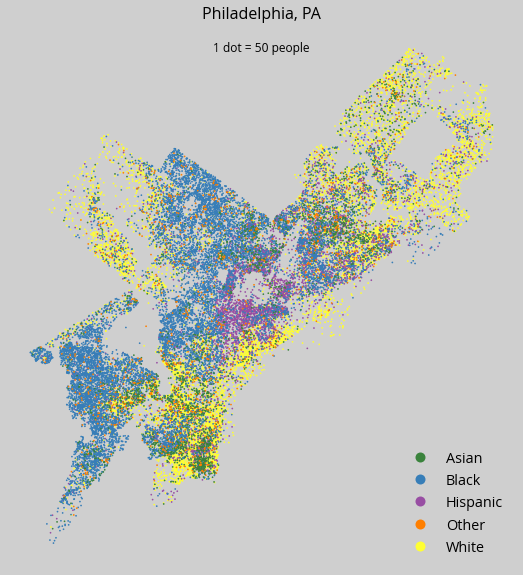

In [105]:
# Initialize the figure and axes
fig, ax = plt.subplots(figsize=(10, 10), facecolor="#cfcfcf")

# Plot
dot_map_3857.plot(
    ax=ax,
    column="field",
    categorical=True,
    legend=True,
    alpha=1,
    markersize=0.5,
    cmap=cmap,
)

# format
ax.set_title("Philadelphia, PA", fontsize=16)
ax.text(
    0.5, 0.95, "1 dot = 50 people", fontsize=12, transform=ax.transAxes, ha="center"
)
ax.set_axis_off()